In [1]:
import torch
import json
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import torch.nn.functional as F

In [2]:
def load_data(pt_path, json_path):
    """
    Wczytuje wektory z sieci i oryginalny przepis na dataset.
    Zwraca tensor PyTorch (features_tensor) i słownik JSON (recipe).
    """
    pt_data = torch.load(pt_path, map_location='cpu')
    features_tensor = pt_data['features']
    with open(json_path, 'r') as f:
        recipe = json.load(f)
    return features_tensor, recipe

def get_concept_vector(feature_name, value_0, value_1, features_tensor, json_recipe):
    """
    Liczy wektor PATCAV (mean_1 - mean_0) i go normalizuje.
    """
    idx_0 = [i for i, bird in enumerate(json_recipe) if bird.get(feature_name) == value_0]
    idx_1 = [i for i, bird in enumerate(json_recipe) if bird.get(feature_name) == value_1]
    
    if not idx_0 or not idx_1:
        raise ValueError(f"BŁĄD: Brak danych dla {feature_name} = {value_0} lub {value_1}")
    
    mean_0 = features_tensor[idx_0].mean(dim=0)
    mean_1 = features_tensor[idx_1].mean(dim=0)
    
    vector = mean_1 - mean_0
    return F.normalize(vector, p=2, dim=0)

In [5]:
def visualize_latent_space(pt_path, json_path, color_by_feature='class_idx', title_suffix=""):
    """
    Rzutuje wielowymiarową przestrzeń ukrytą (Latent Space) na 2D.
    - Pokazuje wynik liniowy (PCA) oraz nieliniowe klastry (t-SNE).
    - color_by_feature: po jakiej cesze kolorujemy kropki (np. 'class_idx', 'beak_model').
    """
    print(f"Wczytywanie danych z: {pt_path}...")
    features_tensor, recipe = load_data(pt_path, json_path)
    features_np = features_tensor.numpy()

    labels = [str(bird.get(color_by_feature, 'unknown')) for bird in recipe]
    
    print("Obliczanie PCA i t-SNE...")
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(features_np)

    tsne = TSNE(n_components=2, perplexity=40, max_iter=1000, random_state=42) 
    tsne_result = tsne.fit_transform(features_np)
    
    df = pd.DataFrame({
        'PCA1': pca_result[:, 0], 'PCA2': pca_result[:, 1],
        'tSNE1': tsne_result[:, 0], 'tSNE2': tsne_result[:, 1],
        'Label': labels
    })
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    fig.suptitle(f"Latent Space - Kolorowanie po: {color_by_feature}\n{title_suffix}", fontsize=16)
    
    sns.scatterplot(x='PCA1', y='PCA2', hue='Label', palette=sns.color_palette("hsv", len(df['Label'].unique())), data=df, legend="full", alpha=0.6, ax=axes[0])
    axes[0].set_title('PCA')
    
    sns.scatterplot(x='tSNE1', y='tSNE2', hue='Label', palette=sns.color_palette("hsv", len(df['Label'].unique())), data=df, legend="full", alpha=0.6, ax=axes[1])
    axes[1].set_title('t-SNE')
    
    plt.tight_layout()
    plt.show()

Wczytywanie danych z: models/features/model_probabilistyczne_szum_features.pt...
Obliczanie PCA i t-SNE...


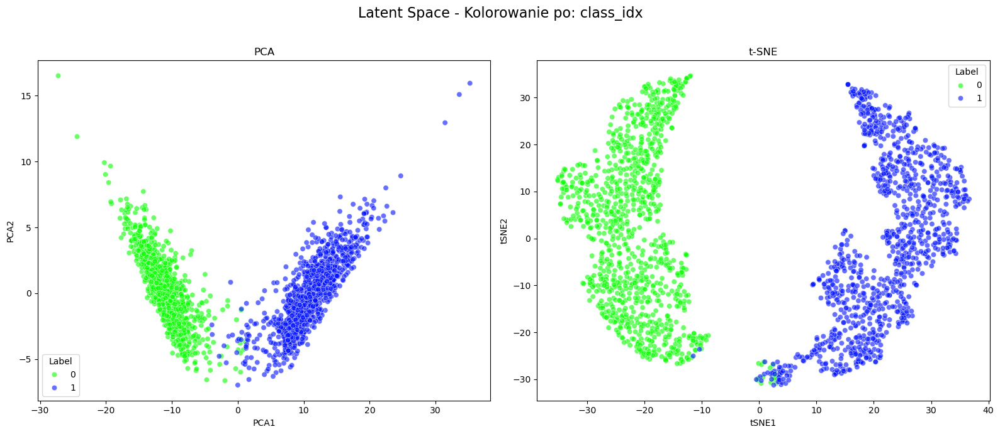

In [6]:
visualize_latent_space(
        pt_path='models/features/model_probabilistyczne_szum_features.pt',
        json_path='tests/testy_probabilistyczne_szum/FunnyBirds/dataset_train.json',
        color_by_feature='class_idx'
    )


Wczytywanie danych z: models/features/model_probabilistyczne_szum_features.pt...
Obliczanie PCA i t-SNE...


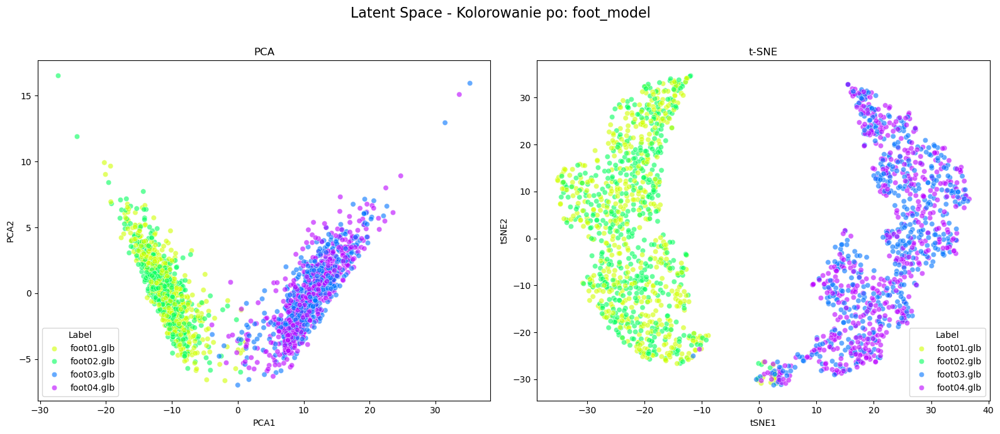

In [7]:
visualize_latent_space(
        pt_path='models/features/model_probabilistyczne_szum_features.pt', 
        json_path='tests/testy_probabilistyczne_szum/FunnyBirds/dataset_train.json',
        color_by_feature='foot_model'
    )
    

Wczytywanie danych z: models/features/model_probabilistyczne_szum_features.pt...
Obliczanie PCA i t-SNE...


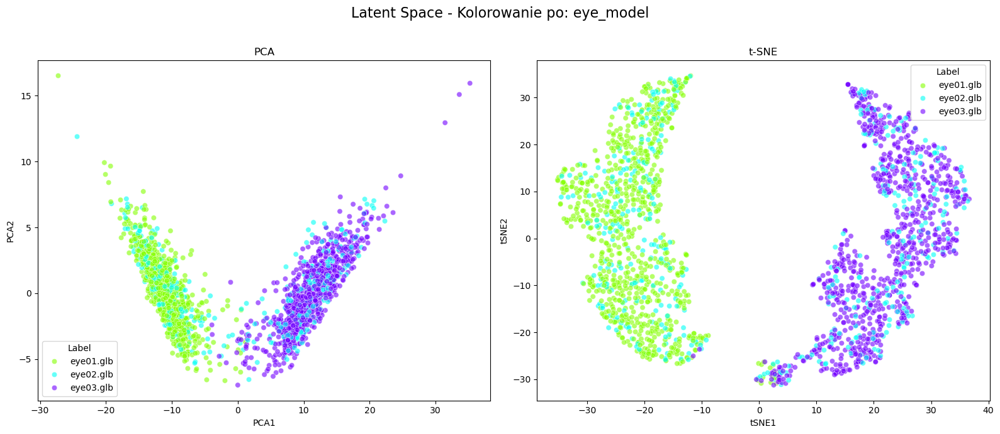

In [8]:
visualize_latent_space(
        pt_path='models/features/model_probabilistyczne_szum_features.pt', 
        json_path='tests/testy_probabilistyczne_szum/FunnyBirds/dataset_train.json',
        color_by_feature='eye_model'
    )

Wczytywanie danych z: models/features/model_niezalezne_features.pt...
Obliczanie PCA i t-SNE...


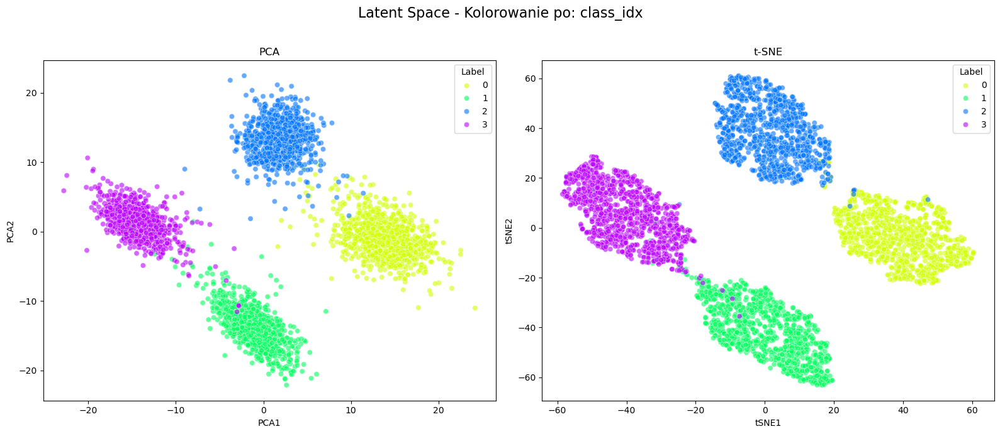

In [9]:
visualize_latent_space(
        pt_path='models/features/model_niezalezne_features.pt',
        json_path='tests/testy_niezalezne/FunnyBirds/dataset_train.json',
        color_by_feature='class_idx'
    )

Wczytywanie danych z: models/features/model_niezalezne_features.pt...
Obliczanie PCA i t-SNE...


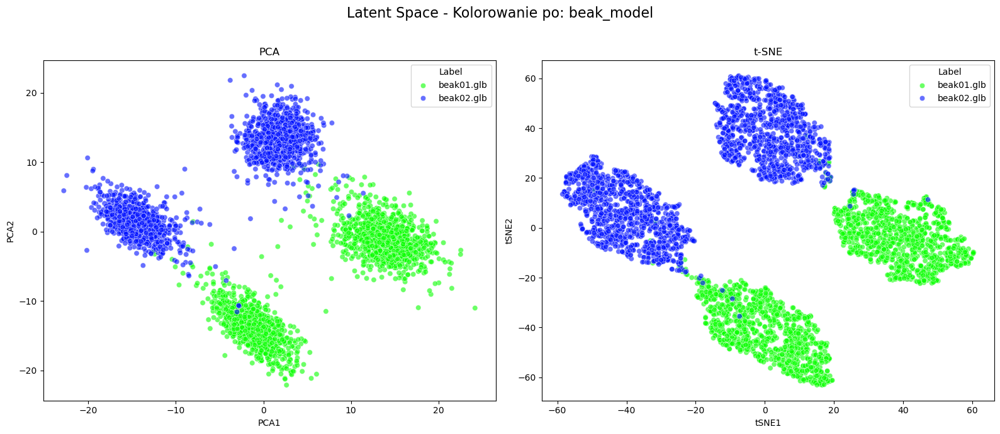

In [10]:
visualize_latent_space(
        pt_path='models/features/model_niezalezne_features.pt',
        json_path='tests/testy_niezalezne/FunnyBirds/dataset_train.json',
        color_by_feature='beak_model'
    )

Wczytywanie danych z: models/features/model_niezalezne_features.pt...
Obliczanie PCA i t-SNE...


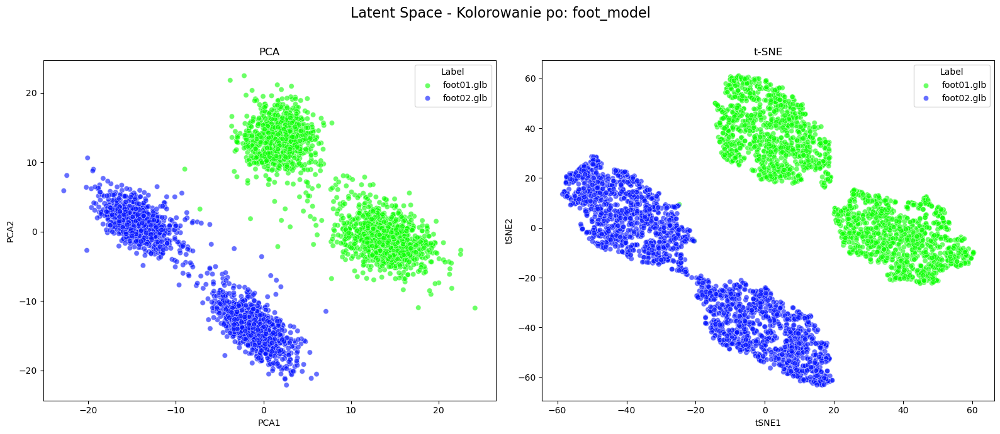

In [11]:
visualize_latent_space(
        pt_path='models/features/model_niezalezne_features.pt',
        json_path='tests/testy_niezalezne/FunnyBirds/dataset_train.json',
        color_by_feature='foot_model'
    )

In [42]:
def visualize_pahde_vs_hcep(pt_path, json_path, feature_A, values_A, feature_B, values_B, title="Porównanie Pahde vs HCEP"):
    """
    Rzutowanie bezpośrednie na wektory. 
    Wektor 1 ZAWSZE staje się osią X, a Wektor 2 ZAWSZE osią Y.
    - Jeśli wektory są spięte (Shortcut Learning), kropki zgnitą się w ukośną linię.
    - Jeśli wektory są niezależne, kropki utworzą szeroką szachownicę.
    """
    print(f"Wczytywanie danych z: {pt_path}...")
    features_tensor, recipe = load_data(pt_path, json_path)
    
    vec_A = get_concept_vector(feature_A, values_A[0], values_A[1], features_tensor, recipe) 
    vec_B = get_concept_vector(feature_B, values_B[0], values_B[1], features_tensor, recipe)
    
    vec_diff = vec_A - vec_B
    vec_diff_norm = F.normalize(vec_diff, p=2, dim=0) 
    
    labels = [f"Klasa {bird.get('class_idx')}" for bird in recipe]
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 9))
    fig.suptitle(title, fontsize=18, fontweight='bold')

    def plot_direct_projection_on_ax(ax, vec_X, vec_Y, label_X, label_Y, subplot_title):
        cos_sim = F.cosine_similarity(vec_X.unsqueeze(0), vec_Y.unsqueeze(0)).item()
        
        x_coords = torch.matmul(features_tensor, vec_X).numpy()
        y_coords = torch.matmul(features_tensor, vec_Y).numpy()
        
        df = pd.DataFrame({'Wymiar X': x_coords, 'Wymiar Y': y_coords, 'Klasa': labels})
        
        sns.scatterplot(x='Wymiar X', y='Wymiar Y', hue='Klasa', palette="bright", data=df, s=50, alpha=0.6, ax=ax)
        
        ax.axhline(0, color='grey', linestyle='--', linewidth=1)
        ax.axvline(0, color='grey', linestyle='--', linewidth=1)
        
        max_val_x = abs(x_coords).max()
        max_val_y = abs(y_coords).max()
        arrow_len = max(max_val_x, max_val_y) * 0.8
        
        ax.arrow(0, 0, arrow_len, 0, head_width=arrow_len*0.03, color='black', linewidth=3, zorder=5)
        ax.text(arrow_len * 1.05, 0, label_X, fontsize=12, fontweight='bold', color='black')
        
        ax.arrow(0, 0, 0, arrow_len, head_width=arrow_len*0.03, color='red', linewidth=3, zorder=5)
        ax.text(0, arrow_len * 1.05, label_Y, fontsize=12, fontweight='bold', color='red')
        
        ax.set_title(f"{subplot_title} Cossim: {cos_sim:.4f}", fontsize=14)
        ax.set_xlabel(label_X)
        ax.set_ylabel(label_Y)
        ax.grid(True, alpha=0.3)
        ax.axis('equal') 


    plot_direct_projection_on_ax(
        ax=axes[0], 
        vec_X=vec_A, 
        vec_Y=vec_B, 
        label_X=f"SV_A: {feature_A}", 
        label_Y=f"SV_B: {feature_B}", 
        subplot_title="Pahde:"
    )

    plot_direct_projection_on_ax(
        ax=axes[1], 
        vec_X=vec_A, 
        vec_Y=vec_diff_norm, 
        label_X=f"SV_A: {feature_A}", 
        label_Y=f"SV_A - SV_B", 
        subplot_title="HCEP:"
    )

    plt.tight_layout()
    plt.show()

In [28]:
def visualize_pca_pahde_vs_hcep(pt_path, json_path, feature_A, values_A, feature_B, values_B, title="Wizualizacja PCA: Pahde vs HCEP"):
    """
    Rzutowanie na Główne Składowe.
    Rozkłada tło na podstawie obiektywnej wariancji z PCA, a następnie rzutuje 
    wyliczone wektory Pahde i HCEP na to płótno, podając wartości Cossim w tytule.
    """
    print(f"Wczytywanie danych z: {pt_path}...")
    features_tensor, recipe = load_data(pt_path, json_path)
    features_np = features_tensor.numpy()
    
    print("Obliczanie PCA...")
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(features_np)
    
    print("Obliczanie wektorów pojęć (512D)...")
    vec_A = get_concept_vector(feature_A, values_A[0], values_A[1], features_tensor, recipe)
    vec_B = get_concept_vector(feature_B, values_B[0], values_B[1], features_tensor, recipe)
    
    vec_diff = vec_A - vec_B
    vec_diff_norm = F.normalize(vec_diff, p=2, dim=0)
    
    cossim_pahde = F.cosine_similarity(vec_A.unsqueeze(0), vec_B.unsqueeze(0)).item()
    cossim_hcep = F.cosine_similarity(vec_diff.unsqueeze(0), vec_A.unsqueeze(0)).item()
    
    pca_vec_A = np.dot(vec_A.numpy(), pca.components_.T)
    pca_vec_B = np.dot(vec_B.numpy(), pca.components_.T)
    pca_vec_diff = np.dot(vec_diff_norm.numpy(), pca.components_.T)
    
    labels = [f"Klasa {bird.get('class_idx')}" for bird in recipe]
    df = pd.DataFrame({'PCA 1': pca_result[:, 0], 'PCA 2': pca_result[:, 1], 'Klasa': labels})
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    fig.suptitle(title, fontsize=18, fontweight='bold')
    
    def plot_pca_arrows(ax, arrow_1, arrow_2, label_1, label_2, subplot_title, show_legend):
        sns.scatterplot(x='PCA 1', y='PCA 2', hue='Klasa', palette="bright", data=df, s=60, alpha=0.4, zorder=1, ax=ax, legend=show_legend)
        ax.axhline(0, color='grey', linestyle='--', linewidth=1)
        ax.axvline(0, color='grey', linestyle='--', linewidth=1)
        
        max_pca = max(abs(pca_result[:, 0]).max(), abs(pca_result[:, 1]).max())
        max_vec = max(np.linalg.norm(arrow_1), np.linalg.norm(arrow_2))
        scale_factor = (max_pca * 0.8) / max_vec if max_vec > 0 else 1
        
        a1_x, a1_y = arrow_1[0] * scale_factor, arrow_1[1] * scale_factor
        a2_x, a2_y = arrow_2[0] * scale_factor, arrow_2[1] * scale_factor
        
        ax.arrow(0, 0, a1_x, a1_y, head_width=max_pca*0.03, color='black', linewidth=3, zorder=5)
        ax.text(a1_x * 1.05, a1_y * 1.05, label_1, fontsize=12, fontweight='bold', color='black')
        ax.arrow(0, 0, a2_x, a2_y, head_width=max_pca*0.03, color='red', linewidth=3, zorder=5)
        ax.text(a2_x * 1.05, a2_y * 1.05, label_2, fontsize=12, fontweight='bold', color='red')

        ax.set_title(subplot_title, fontsize=14)
        ax.set_xlabel(f"Główna Składowa 1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
        ax.set_ylabel(f"Główna Składowa 2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
        ax.grid(True, alpha=0.3)
        ax.axis('equal') 
        
    plot_pca_arrows(
        axes[0], pca_vec_A, pca_vec_B, 
        f"SV(A): {feature_A}", f"SV(B): {feature_B}", 
        f"Pahde: Cossim: {cossim_pahde:.4f}", 
        False
    )
    
    plot_pca_arrows(
        axes[1], pca_vec_diff, pca_vec_A, 
        f"SV(A) - SV(B)", f"SV(A): {feature_A}", 
        f"HCEP: Cossim: {cossim_hcep:.4f}", 
        True
    )

    plt.tight_layout()
    plt.show()

In [37]:
experiments = [
    # ZBIÓR 1
    {"title": "Zbiór 1: Niezależność", "pt": "models/features/model_niezalezne_features.pt", "json": "tests/testy_niezalezne/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot02.glb"]},
    
    # ZBIÓR 2a
    {"title": "Zbiór 2a: Hierarchia Basic", "pt": "models/features/model_hierarchiczne_basic_features.pt", "json": "tests/testy_hierarchiczne_basic/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot02.glb"]},
    
    # ZBIÓR 2b (Hierarchiczne + Kolor)
    # Wariant 100%
    {"title": "2b (100%): Dziób vs Nogi", "pt": "models/features/model_basic_hierarchia100_features.pt", "json": "tests/testy_basic_hierarchia100/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot02.glb"]},
    {"title": "2b (100%): Dziób vs Skrzydła", "pt": "models/features/model_basic_hierarchia100_features.pt", "json": "tests/testy_basic_hierarchia100/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "wing_color", "valB": ["red", "green"]},
    {"title": "2b (100%): Nogi vs Skrzydła", "pt": "models/features/model_basic_hierarchia100_features.pt", "json": "tests/testy_basic_hierarchia100/FunnyBirds/dataset_train.json", "featA": "foot_model", "valA": ["foot01.glb", "foot02.glb"], "featB": "wing_color", "valB": ["green", "blue"]},

    # Wariant 80%
    {"title": "2b (80%): Dziób vs Nogi", "pt": "models/features/model_basic_hierarchia80_features.pt", "json": "tests/testy_basic_hierarchia80/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot02.glb"]},
    {"title": "2b (80%): Dziób vs Skrzydła", "pt": "models/features/model_basic_hierarchia80_features.pt", "json": "tests/testy_basic_hierarchia80/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "wing_color", "valB": ["red", "green"]},
    {"title": "2b (80%): Nogi vs Skrzydła", "pt": "models/features/model_basic_hierarchia80_features.pt", "json": "tests/testy_basic_hierarchia80/FunnyBirds/dataset_train.json", "featA": "foot_model", "valA": ["foot01.glb", "foot02.glb"], "featB": "wing_color", "valB": ["green", "blue"]},

    # Wariant 60%
    {"title": "2b (60%): Dziób vs Nogi", "pt": "models/features/model_basic_hierarchia60_features.pt", "json": "tests/testy_basic_hierarchia60/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot02.glb"]},
    {"title": "2b (60%): Dziób vs Skrzydła", "pt": "models/features/model_basic_hierarchia60_features.pt", "json": "tests/testy_basic_hierarchia60/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "wing_color", "valB": ["red", "green"]},
    {"title": "2b (60%): Nogi vs Skrzydła", "pt": "models/features/model_basic_hierarchia60_features.pt", "json": "tests/testy_basic_hierarchia60/FunnyBirds/dataset_train.json", "featA": "foot_model", "valA": ["foot01.glb", "foot02.glb"], "featB": "wing_color", "valB": ["green", "blue"]},

    # ZBIÓR 3a (Probabilistyczne)
    {"title": "Zbiór 3a: Probabilistyczne", "pt": "models/features/model_probabilistyczne_features.pt", "json": "tests/testy_probabilistyczne/FunnyBirds/dataset_train.json", "featA": "beak_model", "valA": ["beak01.glb", "beak02.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot04.glb"]},
    
    # ZBIÓR 3b, 4a, 4b, 4c (Oczy vs Nogi)
    {"title": "Zbiór 3b: 4b", "pt": "models/features/model_4b_features.pt", "json": "tests/testy_4b/FunnyBirds/dataset_train.json", "featA": "eye_model", "valA": ["eye01.glb", "eye03.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot03.glb"]},
    {"title": "Zbiór 4a: Prob100 szum", "pt": "models/features/model_prob100_szum_features.pt", "json": "tests/testy_prob100_szum/FunnyBirds/dataset_train.json", "featA": "eye_model", "valA": ["eye01.glb", "eye03.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot03.glb"]},
    {"title": "Zbiór 4b: Probabilistyczne szum", "pt": "models/features/model_probabilistyczne_szum_features.pt", "json": "tests/testy_probabilistyczne_szum/FunnyBirds/dataset_train.json", "featA": "eye_model", "valA": ["eye01.glb", "eye03.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot03.glb"]},
    {"title": "Zbiór 4c: Prob 60-40 szum", "pt": "models/features/model_prob60-40_szum_features.pt", "json": "tests/testy_prob60-40_szum/FunnyBirds/dataset_train.json", "featA": "eye_model", "valA": ["eye01.glb", "eye03.glb"], "featB": "foot_model", "valB": ["foot01.glb", "foot03.glb"]},
]



##############################
PRZETWARZANIE: Zbiór 1: Niezależność
##############################
Wczytywanie danych z: models/features/model_niezalezne_features.pt...


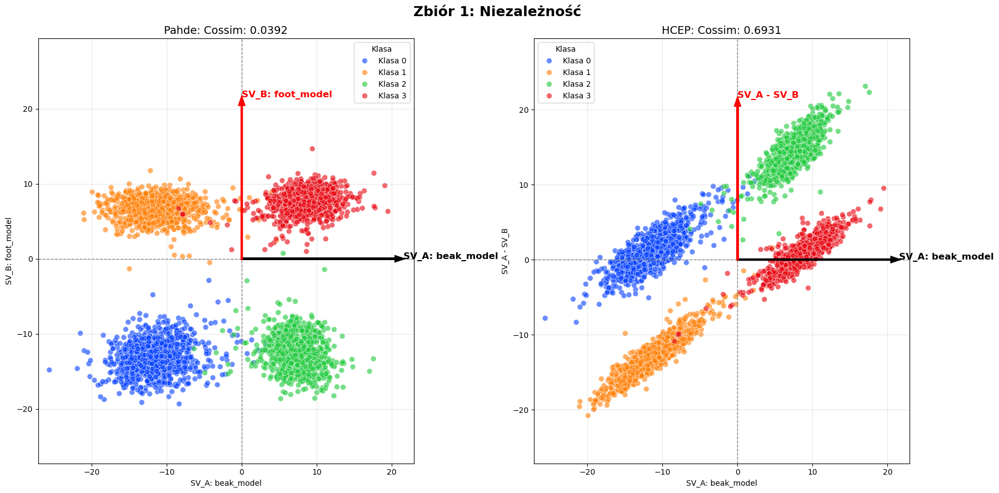

Wczytywanie danych z: models/features/model_niezalezne_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


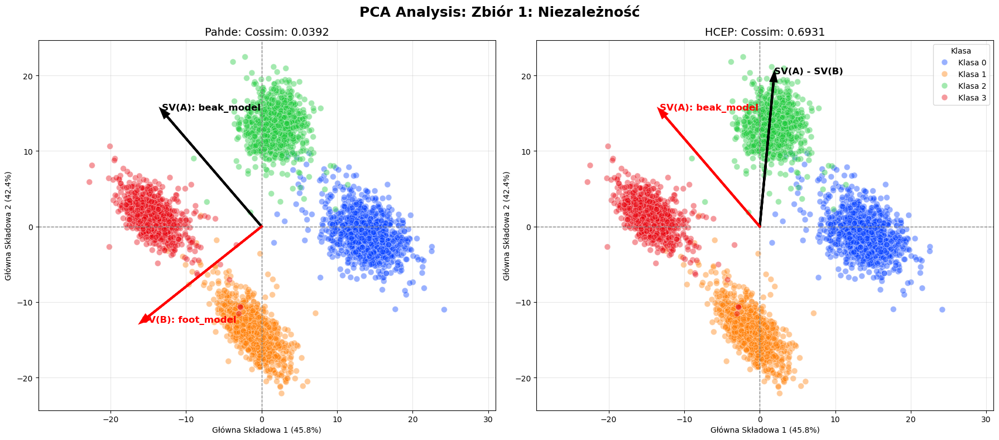


##############################
PRZETWARZANIE: Zbiór 2a: Hierarchia Basic
##############################
Wczytywanie danych z: models/features/model_hierarchiczne_basic_features.pt...


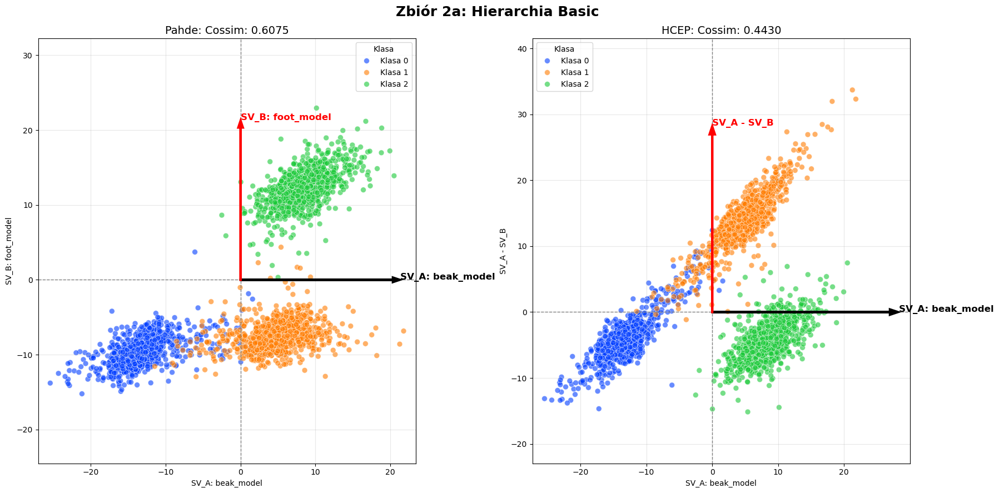

Wczytywanie danych z: models/features/model_hierarchiczne_basic_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


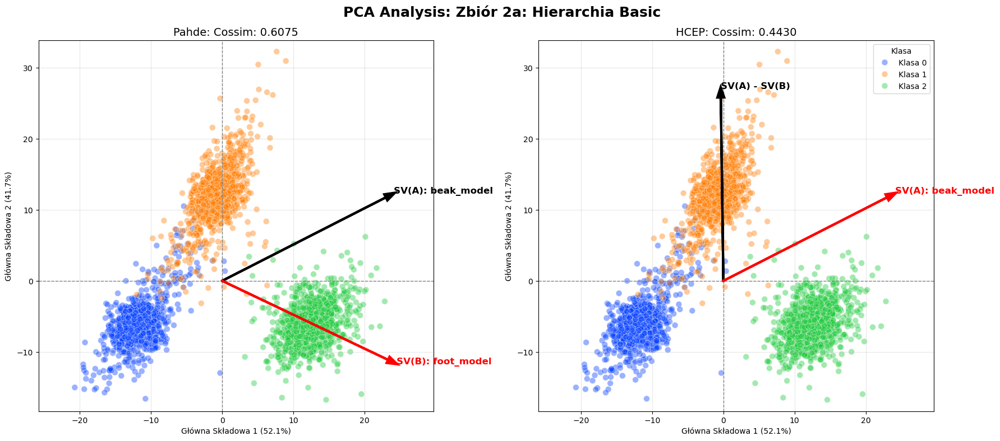


##############################
PRZETWARZANIE: 2b (100%): Dziób vs Nogi
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia100_features.pt...


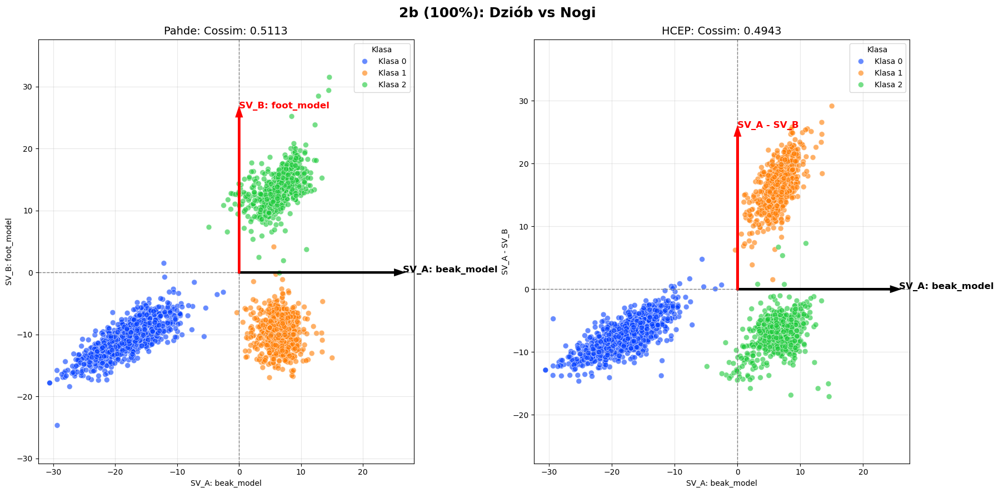

Wczytywanie danych z: models/features/model_basic_hierarchia100_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


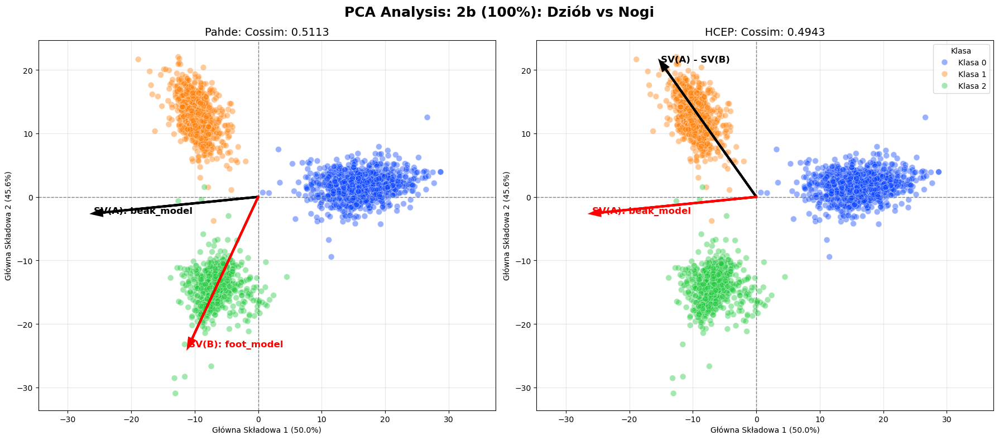


##############################
PRZETWARZANIE: 2b (100%): Dziób vs Skrzydła
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia100_features.pt...


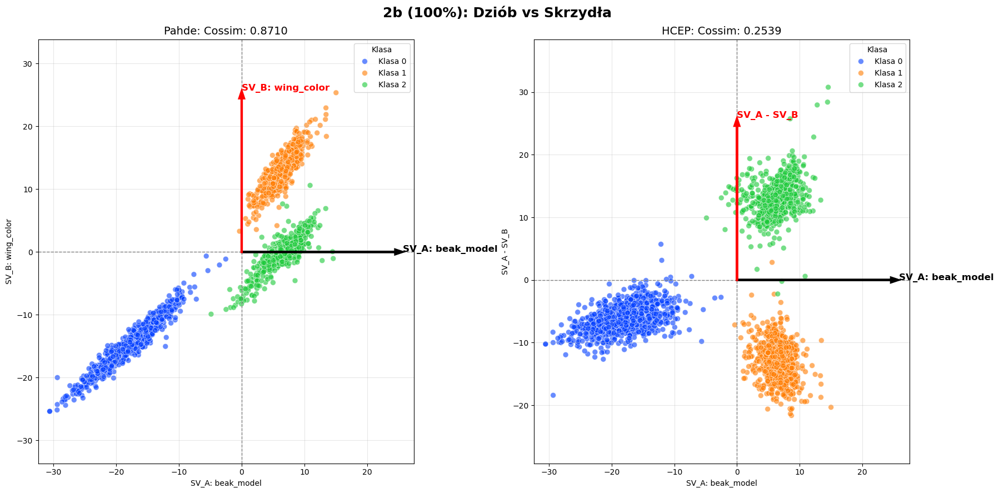

Wczytywanie danych z: models/features/model_basic_hierarchia100_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


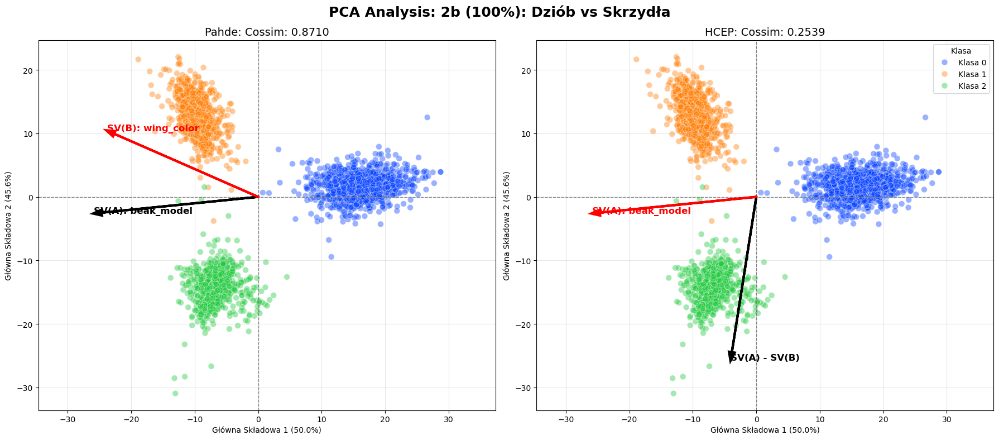


##############################
PRZETWARZANIE: 2b (100%): Nogi vs Skrzydła
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia100_features.pt...


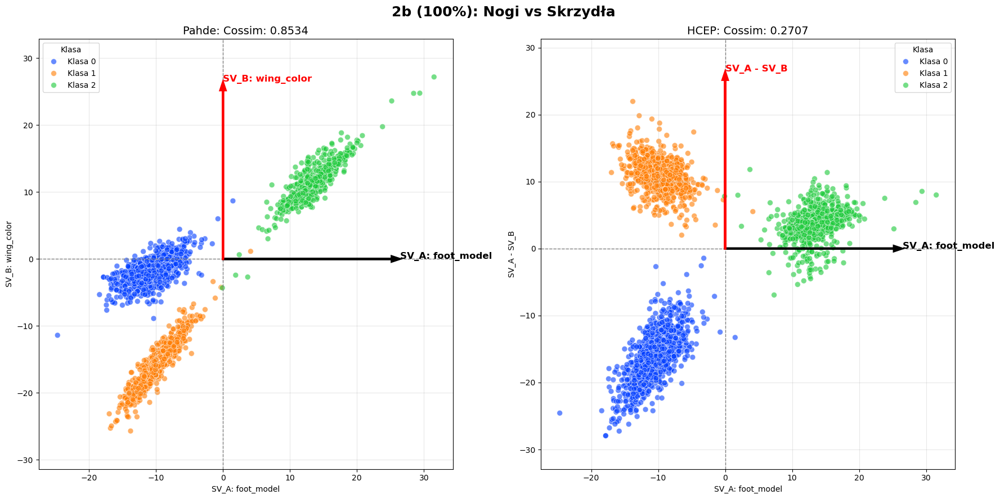

Wczytywanie danych z: models/features/model_basic_hierarchia100_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


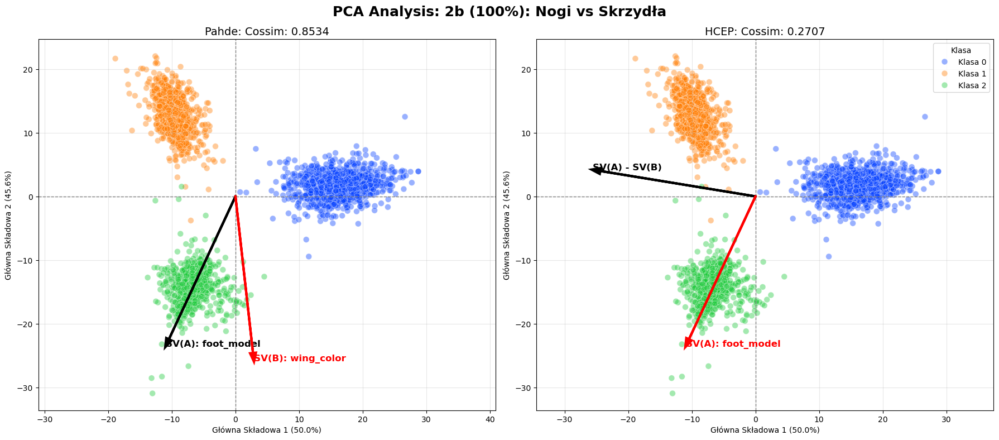


##############################
PRZETWARZANIE: 2b (80%): Dziób vs Nogi
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia80_features.pt...


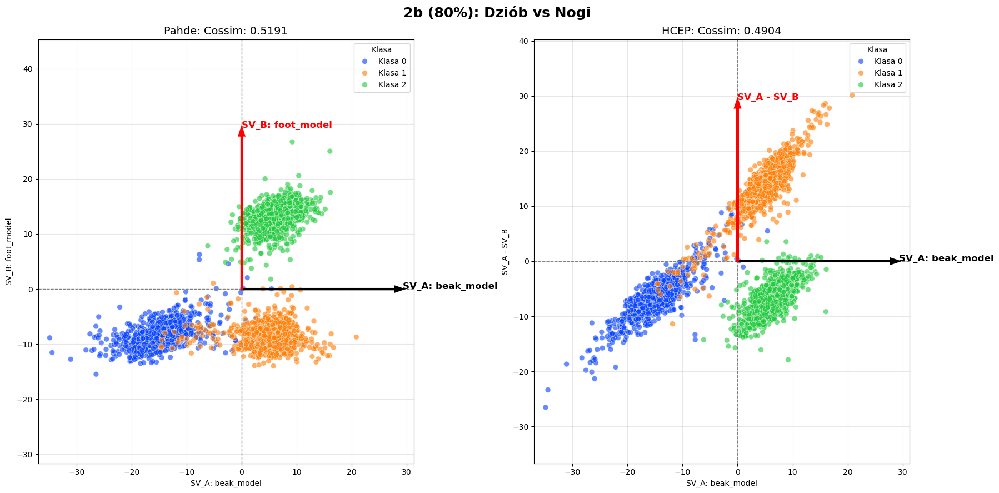

Wczytywanie danych z: models/features/model_basic_hierarchia80_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


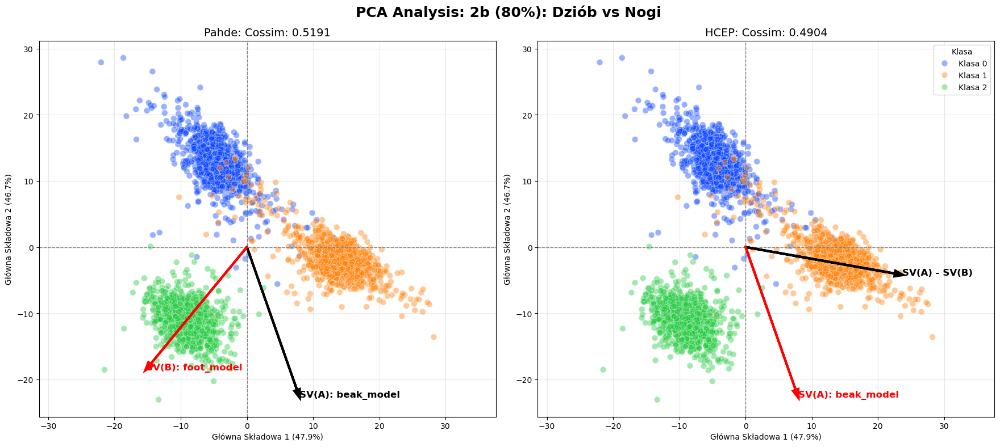


##############################
PRZETWARZANIE: 2b (80%): Dziób vs Skrzydła
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia80_features.pt...


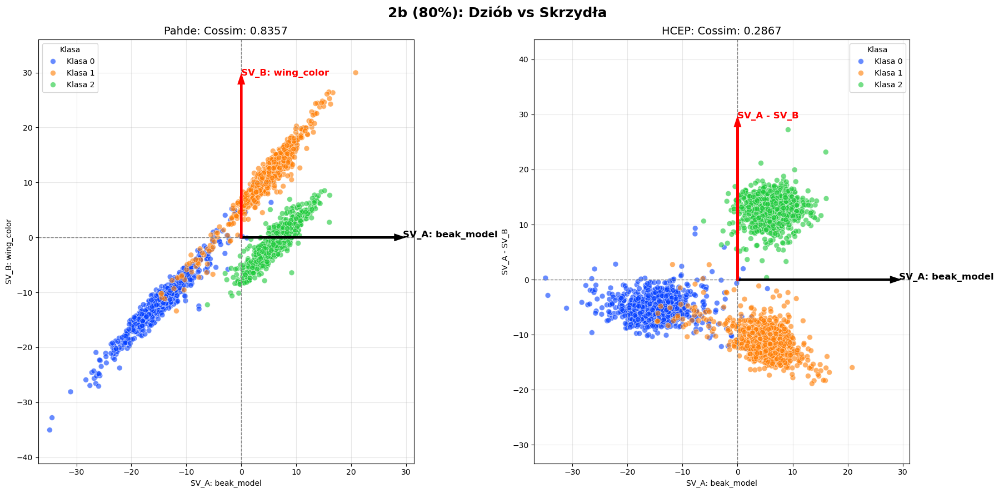

Wczytywanie danych z: models/features/model_basic_hierarchia80_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


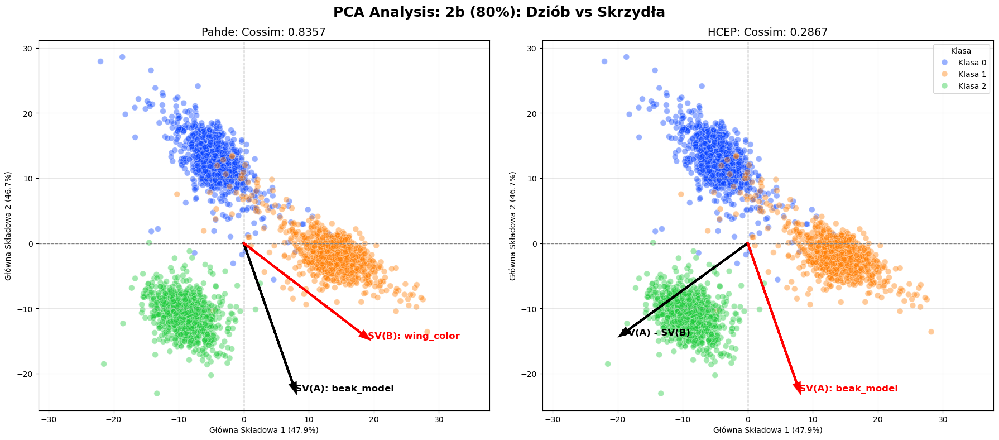


##############################
PRZETWARZANIE: 2b (80%): Nogi vs Skrzydła
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia80_features.pt...


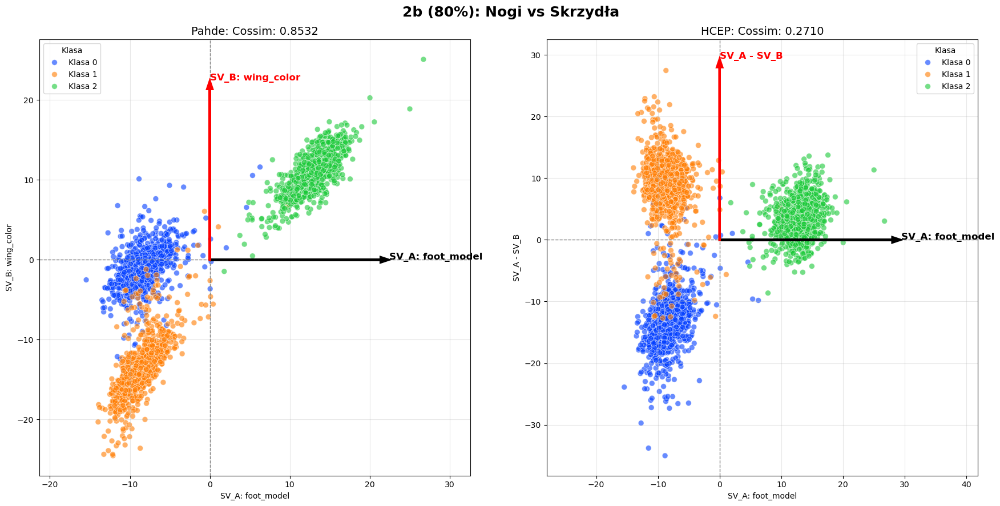

Wczytywanie danych z: models/features/model_basic_hierarchia80_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


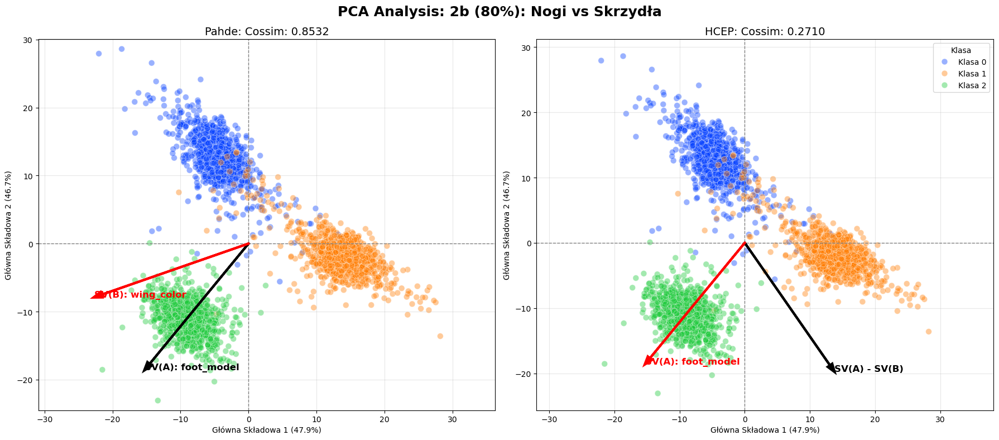


##############################
PRZETWARZANIE: 2b (60%): Dziób vs Nogi
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia60_features.pt...


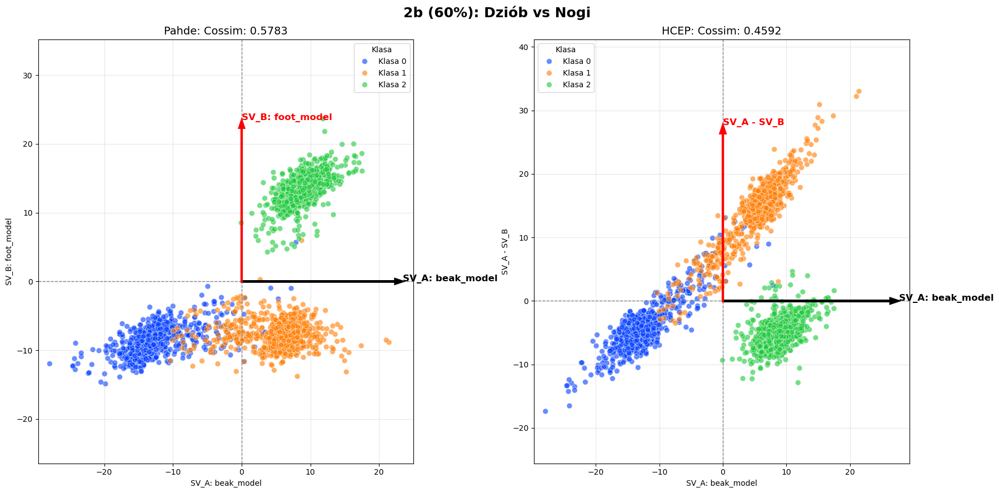

Wczytywanie danych z: models/features/model_basic_hierarchia60_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


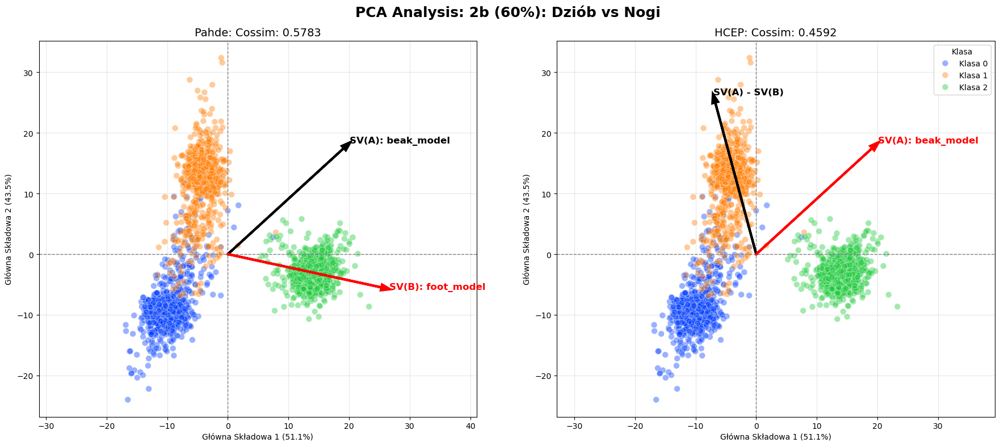


##############################
PRZETWARZANIE: 2b (60%): Dziób vs Skrzydła
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia60_features.pt...


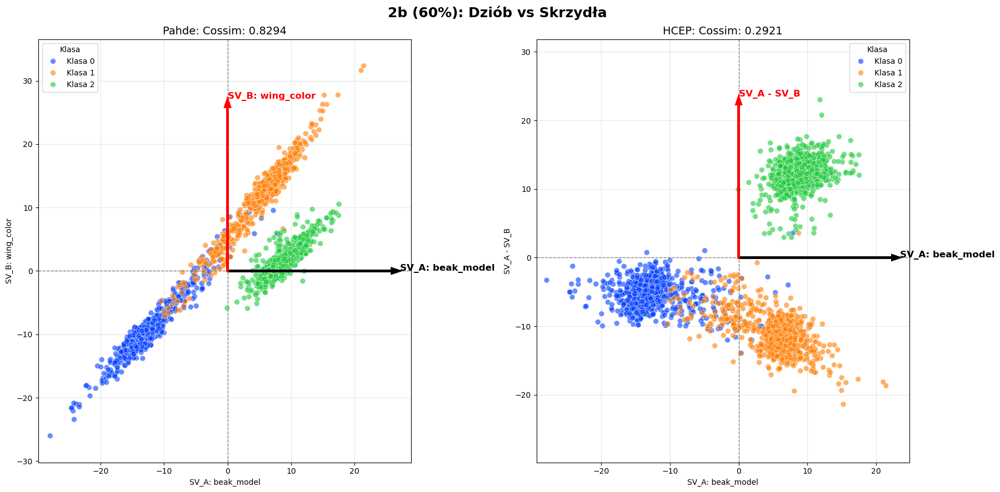

Wczytywanie danych z: models/features/model_basic_hierarchia60_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


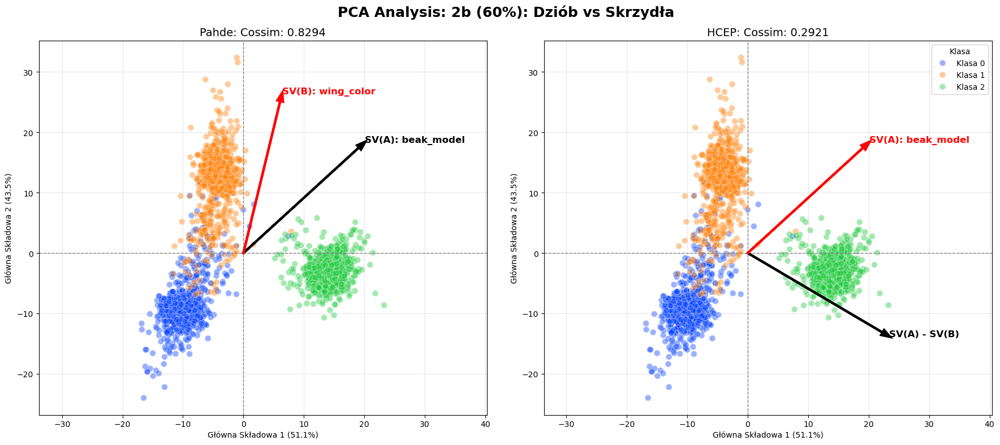


##############################
PRZETWARZANIE: 2b (60%): Nogi vs Skrzydła
##############################
Wczytywanie danych z: models/features/model_basic_hierarchia60_features.pt...


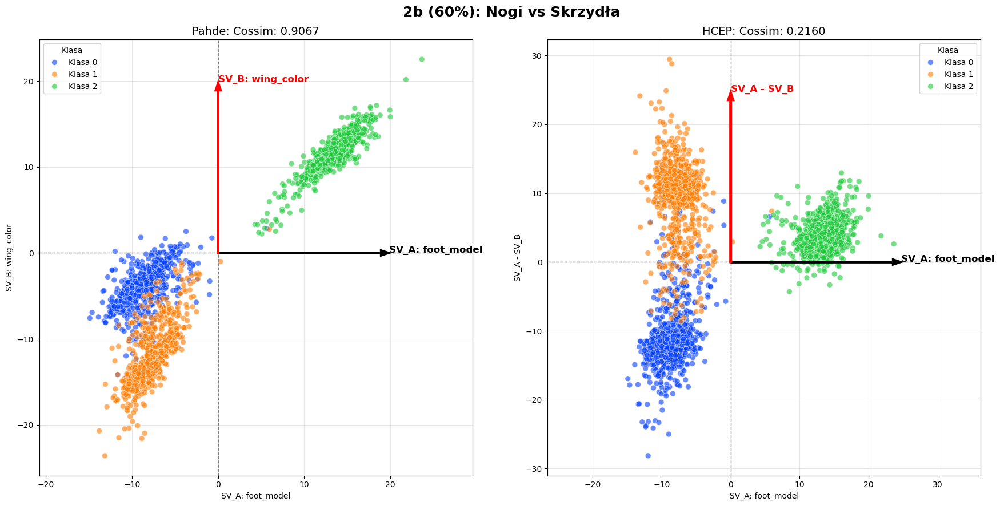

Wczytywanie danych z: models/features/model_basic_hierarchia60_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


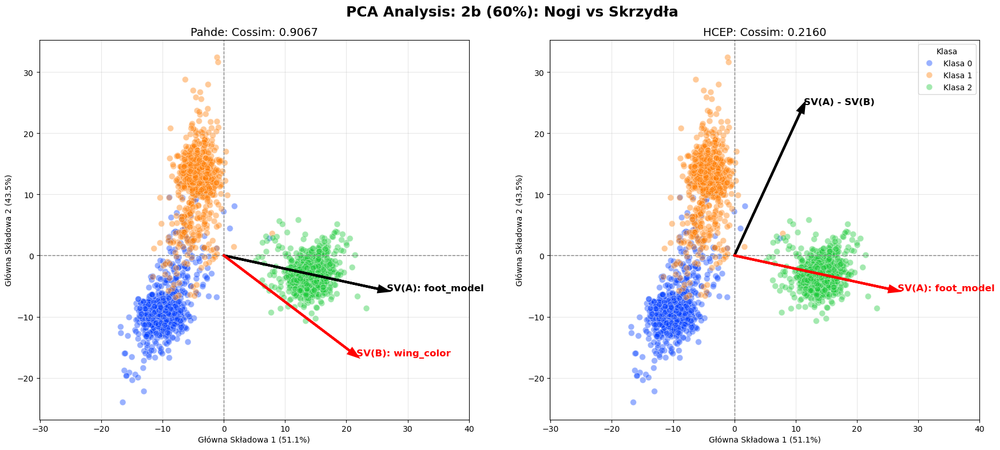


##############################
PRZETWARZANIE: Zbiór 3a: Probabilistyczne
##############################
Wczytywanie danych z: models/features/model_probabilistyczne_features.pt...


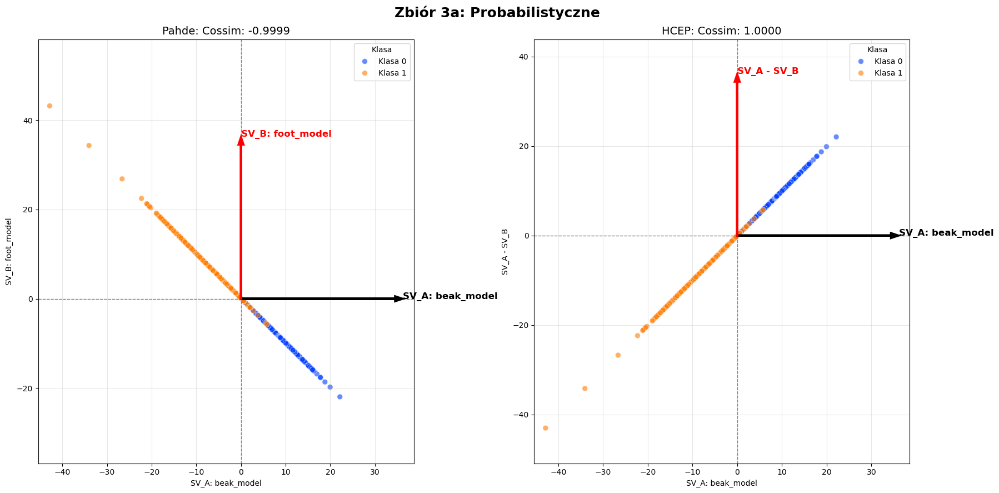

Wczytywanie danych z: models/features/model_probabilistyczne_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


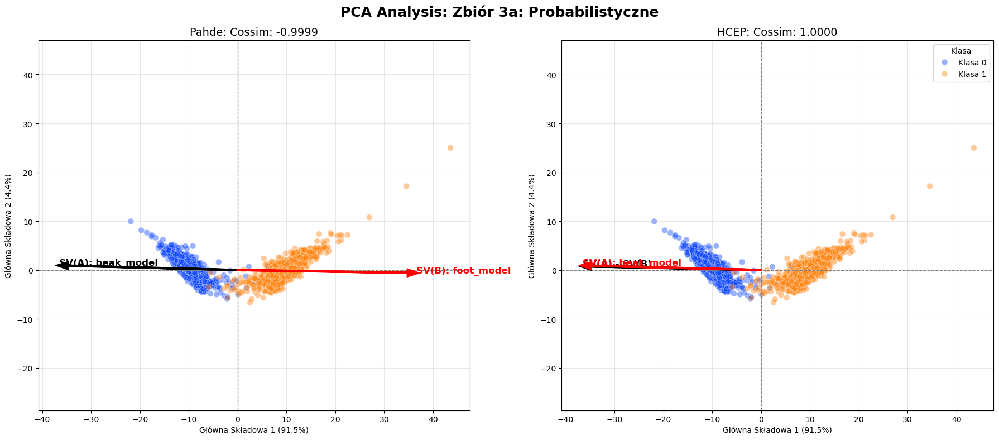


##############################
PRZETWARZANIE: Zbiór 3b: 4b
##############################
Wczytywanie danych z: models/features/model_4b_features.pt...


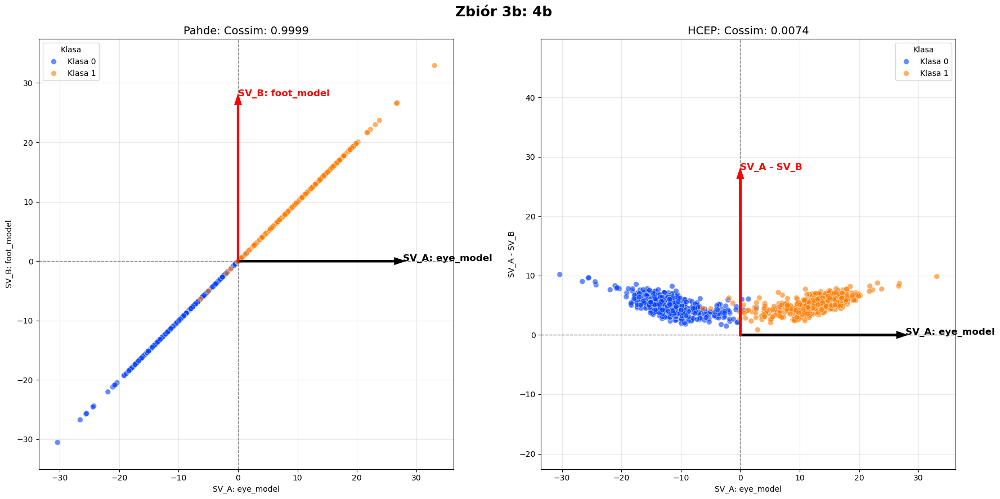

Wczytywanie danych z: models/features/model_4b_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


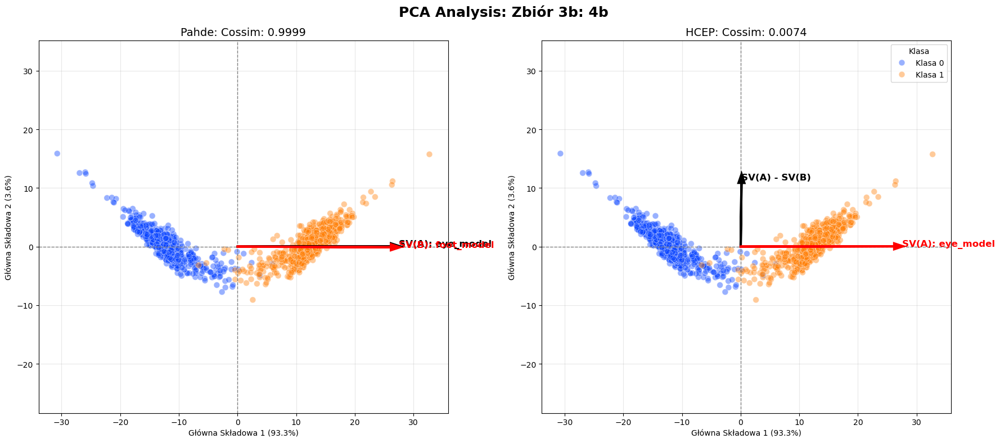


##############################
PRZETWARZANIE: Zbiór 4a: Prob100 szum
##############################
Wczytywanie danych z: models/features/model_prob100_szum_features.pt...


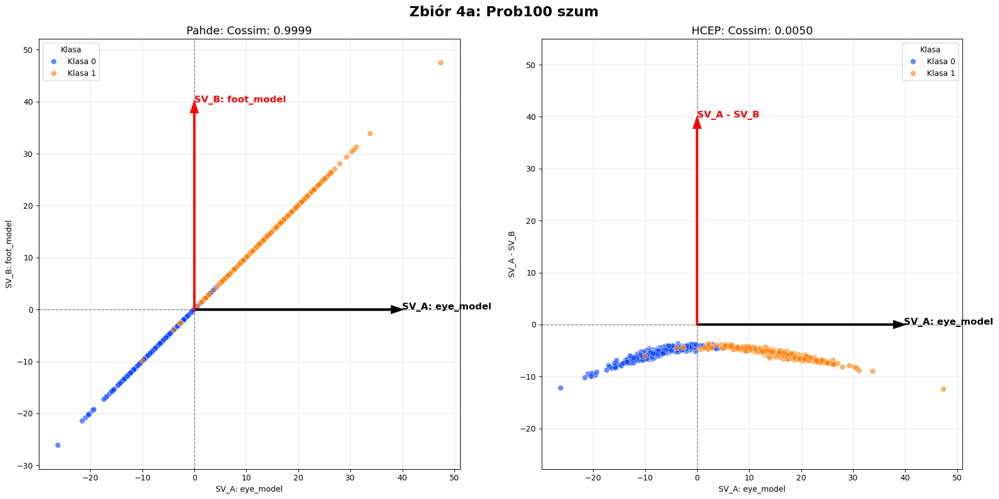

Wczytywanie danych z: models/features/model_prob100_szum_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


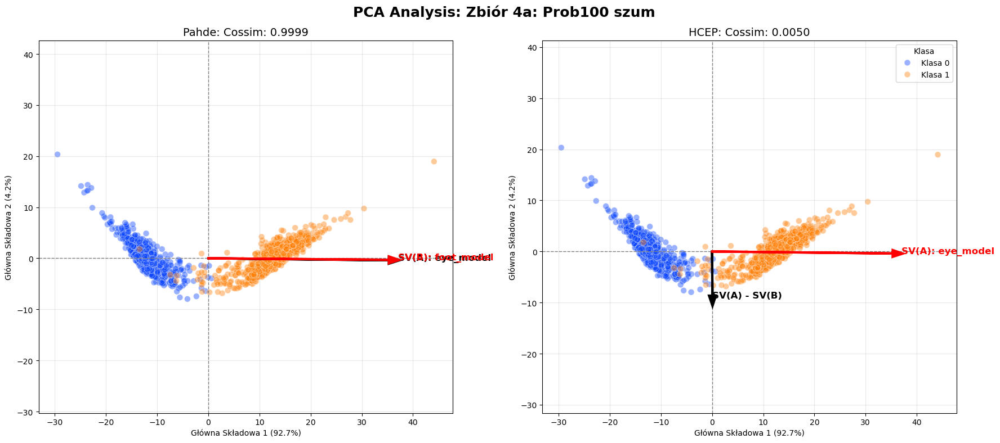


##############################
PRZETWARZANIE: Zbiór 4b: Probabilistyczne szum
##############################
Wczytywanie danych z: models/features/model_probabilistyczne_szum_features.pt...


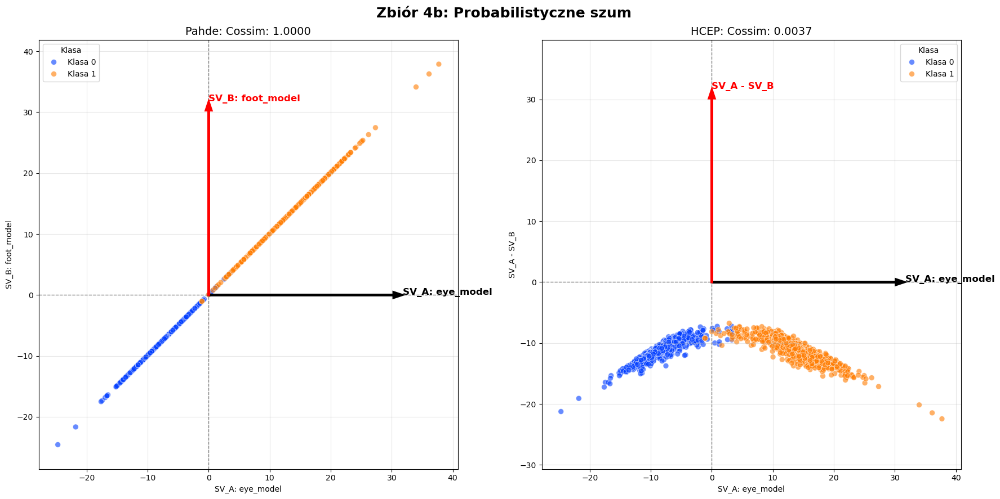

Wczytywanie danych z: models/features/model_probabilistyczne_szum_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


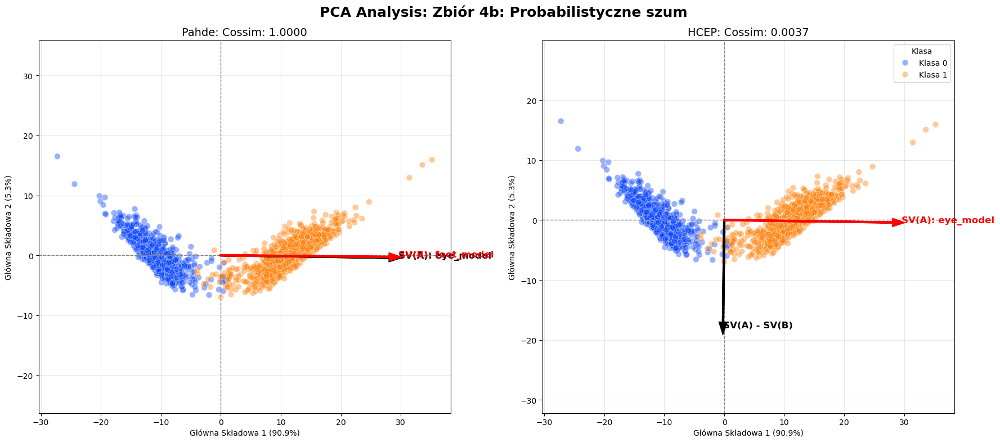


##############################
PRZETWARZANIE: Zbiór 4c: Prob 60-40 szum
##############################
Wczytywanie danych z: models/features/model_prob60-40_szum_features.pt...


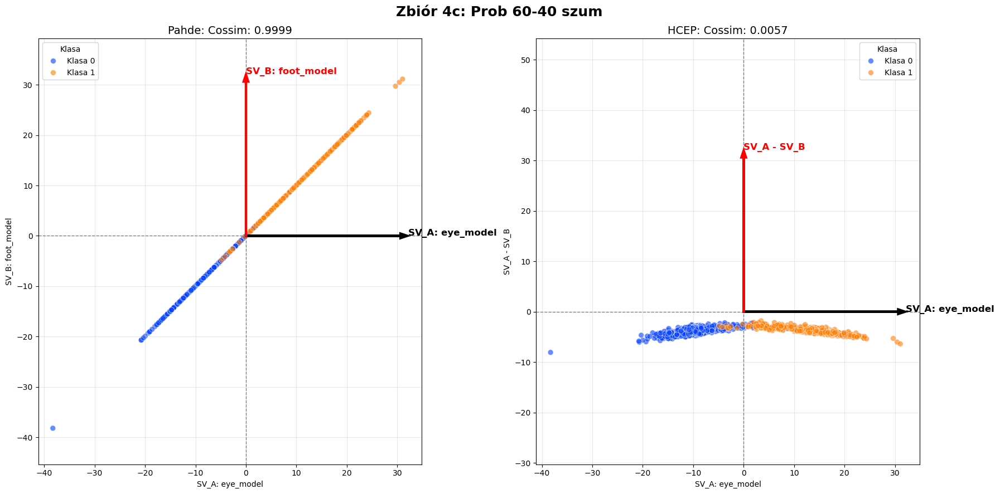

Wczytywanie danych z: models/features/model_prob60-40_szum_features.pt...
Obliczanie PCA...
Obliczanie wektorów pojęć (512D)...


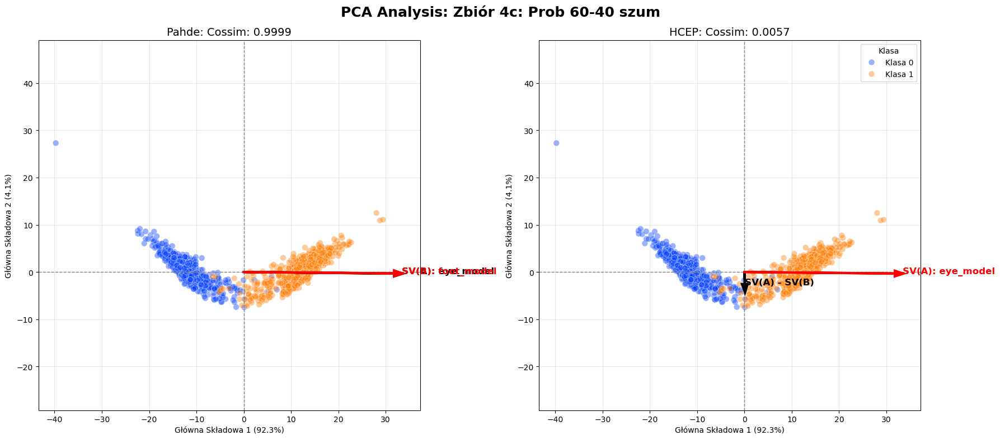

In [41]:
for exp in experiments:
    try:
        print(f"\n{'#'*30}\nPRZETWARZANIE: {exp['title']}\n{'#'*30}")
        
        # 1. Pahde vs HCEP (Osi bezpośrednie)
        visualize_pahde_vs_hcep(
            exp['pt'], exp['json'], 
            exp['featA'], exp['valA'], 
            exp['featB'], exp['valB'], 
            title=exp['title']
        )
        
        # 2. PCA Biplot
        visualize_pca_pahde_vs_hcep(
            exp['pt'], exp['json'], 
            exp['featA'], exp['valA'], 
            exp['featB'], exp['valB'], 
            title=f"PCA Analysis: {exp['title']}"
        )
    except Exception as e:
        print(f"BŁĄD w eksperymencie {exp['title']}: {e}")